<a href="https://colab.research.google.com/github/gnithinreddy03/mini-project/blob/main/anpr2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
import tensorflow as tf
!pip install pytesseract 
import pytesseract as pt
import plotly.express as px
import matplotlib.pyplot as plt
import xml.etree.ElementTree as xet

from glob import glob
from skimage import io
from shutil import copy
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import TensorBoard
from sklearn.model_selection import train_test_split
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.layers import Dense, Dropout, Flatten, Input
from tensorflow.keras.preprocessing.image import load_img, img_to_array

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
path = glob('/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/*.xml')
labels_dict = dict(filepath=[],xmin=[],xmax=[],ymin=[],ymax=[])
for filename in path:

    info = xet.parse(filename)
    root = info.getroot()
    member_object = root.find('object')
    labels_info = member_object.find('bndbox')
    xmin = int(labels_info.find('xmin').text)
    xmax = int(labels_info.find('xmax').text)
    ymin = int(labels_info.find('ymin').text)
    ymax = int(labels_info.find('ymax').text)

    labels_dict['filepath'].append(filename)
    labels_dict['xmin'].append(xmin)
    labels_dict['xmax'].append(xmax)
    labels_dict['ymin'].append(ymin)
    labels_dict['ymax'].append(ymax)

In [ ]:
df = pd.DataFrame(labels_dict)
df.to_csv('labels.csv',index=False)
df.head()

,filepath,xmin,xmax,ymin,ymax
0,/content/drive/MyDrive/Colab Notebooks/indian-...,184,292,572,648
1,/content/drive/MyDrive/Colab Notebooks/indian-...,327,399,202,227
2,/content/drive/MyDrive/Colab Notebooks/indian-...,140,339,210,260
3,/content/drive/MyDrive/Colab Notebooks/indian-...,28,342,29,106
4,/content/drive/MyDrive/Colab Notebooks/indian-...,185,324,114,148


In [ ]:
filename = df['filepath'][0]
def getFilename(filename):
    filename_image = xet.parse(filename).getroot().find('filename').text
    filepath_image = os.path.join('/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/',filename_image)
    return filepath_image
getFilename(filename)

'/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/00b42b2c-f193-4863-b92c-0245cbc816da___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-Petrol-Review-Images-Black-Front-Angle.jpg'

In [ ]:
image_path = list(df['filepath'].apply(getFilename))
image_path[:10]

['/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/00b42b2c-f193-4863-b92c-0245cbc816da___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_Nissan-Terrano-Petrol-Review-Images-Black-Front-Angle.jpg',
 '/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/018b52e6-e9a1-42c2-8ce7-0617e8c8e021___3e7fd381-0ae5-4421-8a70-279ee0ec1c61_sbtb02_auto1.JPG',
 '/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/0073797c-a755-4972-b76b-8ef2b31d44ab___new_IMG_20160315_071740.jpg.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/07e787a7-6cc3-482c-9ce5-f0ce115b47f1___new_VW-Polo-GT-TSI-badges-on-the-boot-lid.jpg.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/0c9ebe94-827d-4c74-9950-6816e70d1bab___IMG_8883.jpg.jpeg',
 '/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/03273806-bb1e-48da-8c8b-a0133a90197a___2014-Skoda-Yeti-Test-Drive.jpg.jpeg',


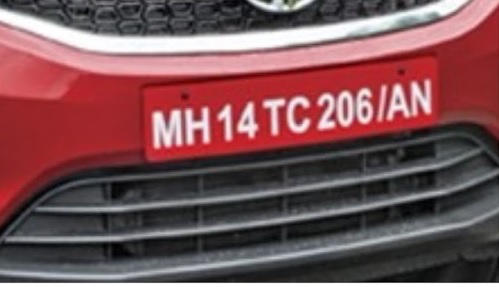

In [ ]:
file_path = image_path[87] #path of our image N2.jpeg
img = cv2.imread(file_path) #read the image
#xmin-1804/ymin-1734/xmax-2493/ymax-1882 
img = io.imread(file_path) #Read the image
fig = px.imshow(img)
fig.update_layout(width=600, height=500, margin=dict(l=10, r=10, b=10, t=10),xaxis_title='Figure 8 - N2.jpeg with bounding box')
fig.add_shape(type='rect',x0=1804, x1=2493, y0=1734, y1=1882, xref='x', yref='y',line_color='cyan')

In [ ]:
#DATA PROCESSING
labels = df.iloc[:,1:].values
data = []
output = []
for ind in range(len(image_path)):
    image = image_path[ind]
    img_arr = cv2.imread(image)
    h,w,d = img_arr.shape
    # Prepprocesing
    load_image = load_img(image,target_size=(224,224))
    load_image_arr = img_to_array(load_image)
    norm_load_image_arr = load_image_arr/255.0 # Normalization
    # Normalization to labels
    xmin,xmax,ymin,ymax = labels[ind]
    nxmin,nxmax = xmin/w,xmax/w
    nymin,nymax = ymin/h,ymax/h
    label_norm = (nxmin,nxmax,nymin,nymax) # Normalized output
    # Append
    data.append(norm_load_image_arr)
    output.append(label_norm)

In [ ]:
# Convert data to array
X = np.array(data,dtype=np.float32)
y = np.array(output,dtype=np.float32)

In [ ]:
# Split the data into training and testing set using sklearn.
x_train,x_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=0)
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((352, 224, 224, 3), (88, 224, 224, 3), (352, 4), (88, 4))

In [ ]:
# parsing
def parsing(path):
    parser = xet.parse(path).getroot()
    name = parser.find('filename').text
    filename = f'/content/drive/MyDrive/Colab Notebooks/indian-vehicle-dataset/google_images/{name}'

    # width and height
    parser_size = parser.find('size')
    width = int(parser_size.find('width').text)
    height = int(parser_size.find('height').text)
    
    return filename, width, height
df[['filename','width','height']] = df['filepath'].apply(parsing).apply(pd.Series)
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height
0,/content/drive/MyDrive/Colab Notebooks/indian-...,184,292,572,648,/content/drive/MyDrive/Colab Notebooks/indian-...,1280,853
1,/content/drive/MyDrive/Colab Notebooks/indian-...,327,399,202,227,/content/drive/MyDrive/Colab Notebooks/indian-...,660,280
2,/content/drive/MyDrive/Colab Notebooks/indian-...,140,339,210,260,/content/drive/MyDrive/Colab Notebooks/indian-...,500,335
3,/content/drive/MyDrive/Colab Notebooks/indian-...,28,342,29,106,/content/drive/MyDrive/Colab Notebooks/indian-...,395,147
4,/content/drive/MyDrive/Colab Notebooks/indian-...,185,324,114,148,/content/drive/MyDrive/Colab Notebooks/indian-...,500,333


In [ ]:
df['center_x'] = (df['xmax'] + df['xmin'])/(2*df['width'])
df['center_y'] = (df['ymax'] + df['ymin'])/(2*df['height'])

df['bb_width'] = (df['xmax'] - df['xmin'])/df['width']
df['bb_height'] = (df['ymax'] - df['ymin'])/df['height']
df.head()

,filepath,xmin,xmax,ymin,ymax,filename,width,height,center_x,center_y,bb_width,bb_height
0,/content/drive/MyDrive/Colab Notebooks/indian-...,184,292,572,648,/content/drive/MyDrive/Colab Notebooks/indian-...,1280,853,0.185938,0.715123,0.084375,0.089097
1,/content/drive/MyDrive/Colab Notebooks/indian-...,327,399,202,227,/content/drive/MyDrive/Colab Notebooks/indian-...,660,280,0.550000,0.766071,0.109091,0.089286
2,/content/drive/MyDrive/Colab Notebooks/indian-...,140,339,210,260,/content/drive/MyDrive/Colab Notebooks/indian-...,500,335,0.479000,0.701493,0.398000,0.149254
3,/content/drive/MyDrive/Colab Notebooks/indian-...,28,342,29,106,/content/drive/MyDrive/Colab Notebooks/indian-...,395,147,0.468354,0.459184,0.794937,0.523810
4,/content/drive/MyDrive/Colab Notebooks/indian-...,185,324,114,148,/content/drive/MyDrive/Colab Notebooks/indian-...,500,333,0.509000,0.393393,0.278000,0.102102


In [ ]:
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 15705, done.
remote: Counting objects: 100% (33/33), done.
remote: Compressing objects: 100% (29/29), done.
remote: Total 15705 (delta 8), reused 18 (delta 4), pack-reused 15672
Receiving objects: 100% (15705/15705), 14.51 MiB | 31.01 MiB/s, done.
Resolving deltas: 100% (10749/10749), done.


In [ ]:
!pip install -r ./yolov5/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 7.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 589.4/589.4 kB 38.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 206.5/206.5 kB 23.3 MB/s eta 0:00:00


In [ ]:
mkdir /content/yolov5/data_images/

In [ ]:
mkdir /content/yolov5/data_images/test/

In [ ]:
mkdir /content/yolov5/data_images/train/

In [ ]:
### split the data into train and test
df_train = df.iloc[:200]
df_test = df.iloc[200:]

In [ ]:
train_folder = './yolov5/data_images/train'

values = df_train[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(train_folder,image_name)
    dst_label_file = os.path.join(train_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

test_folder = './yolov5/data_images/test'

values = df_test[['filename','center_x','center_y','bb_width','bb_height']].values
for fname, x,y, w, h in values:
    image_name = os.path.split(fname)[-1]
    txt_name = os.path.splitext(image_name)[0]
    
    dst_image_path = os.path.join(test_folder,image_name)
    dst_label_file = os.path.join(test_folder,txt_name+'.txt')
    
    # copy each image into the folder
    copy(fname,dst_image_path)

    # generate .txt which has label info
    label_txt = f'0 {x} {y} {w} {h}'
    with open(dst_label_file,mode='w') as f:
        f.write(label_txt)
        
        f.close()

In [ ]:
import yaml
yaml_dict = {'train': 'data_images/train',   # path to the train folder
            'val': 'data_images/test', # path to the val folder
            'nc': 1,                             # number of classes
            'names': ['liscence_plate']}                # list of label names

with open(r'./yolov5/data.yaml', 'w') as file:
    documents = yaml.dump(yaml_dict, file)

In [ ]:
!nvidia-smi

Wed May 24 17:57:16 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install torch
!pip install GPUtil

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for GPUtil: filename=GPUtil-1.4.0-py3-none-any.whl size=7393 sha256=1c3466e05e611311473f369fabc3a94045ad934c3b668f2ddfacdd2cec2077f5
  Stored in directory: /root/.cache/pip/wheels/a9/8a/bd/81082387151853ab8b6b3ef33426e98f5cbfebc3c397a9d4d0
Successfully built GPUtil


In [ ]:
import torch
from GPUtil import showUtilization as gpu_usage
from numba import cuda

def free_gpu_cache():
    print("Initial GPU Usage")
    gpu_usage()                             

    torch.cuda.empty_cache()

    cuda.select_device(0)
    cuda.close()
    cuda.select_device(0)

    print("GPU Usage after emptying the cache")
    gpu_usage()

free_gpu_cache() 

Initial GPU Usage
| ID | GPU | MEM |
------------------
|  0 |  0% |  0% |
GPU Usage after emptying the cache
| ID | GPU | MEM |
------------------
|  0 |  5% |  1% |


In [ ]:
!python ./yolov5/train.py --data ./yolov5/data.yaml --cfg ./yolov5/models/yolov5s.yaml --batch-size 8 --name Model --epochs 100

train: weights=yolov5/yolov5s.pt, cfg=./yolov5/models/yolov5s.yaml, data=./yolov5/data.yaml, hyp=yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=8, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yolov5/runs/train, name=Model, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, ancho

In [ ]:
!python ./yolov5/export.py --weight ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx

export: data=yolov5/data/coco128.yaml, weights=['./yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from yolov5/runs/train/Model/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)

TorchScript: starting export with torch 2.0.1+cu118...
TorchScript: export success ✅ 2.6s, saved as yolov5/runs/train/Model/weights/best.torchscript (27.2 MB)

ONNX: starting export with onnx 1.14.0...
============= Diagnostic Run torch.onnx.export version 2.0.1+cu118 =============
verbose: False, log level: Level.ERROR
=========

In [ ]:
!python ./yolov5/export.py --weights ./yolov5/runs/train/Model/weights/best.pt --include torchscript onnx --opset 11

export: data=yolov5/data/coco128.yaml, weights=['./yolov5/runs/train/Model/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=11, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['torchscript', 'onnx']
YOLOv5 🚀 v7.0-172-gc3c1304 Python-3.10.11 torch-2.0.1+cu118 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from yolov5/runs/train/Model/weights/best.pt with output shape (1, 25200, 6) (13.7 MB)

TorchScript: starting export with torch 2.0.1+cu118...
TorchScript: export success ✅ 2.7s, saved as yolov5/runs/train/Model/weights/best.torchscript (27.2 MB)

ONNX: starting export with onnx 1.14.0...
============= Diagnostic Run torch.onnx.export version 2.0.1+cu118 =============
verbose: False, log level: Level.ERROR
=========

In [ ]:
INPUT_WIDTH =  640
INPUT_HEIGHT = 640


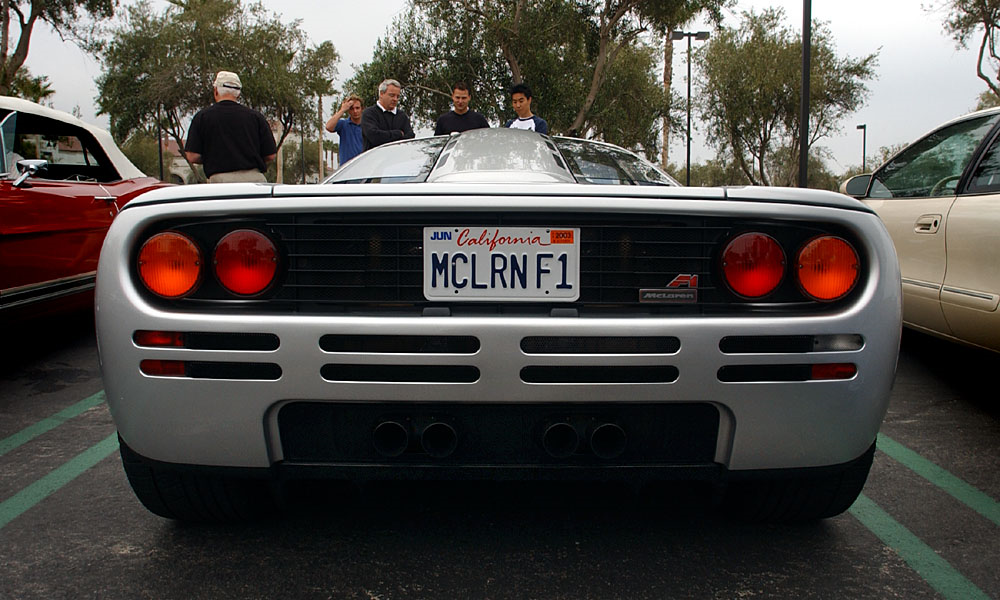

In [ ]:
img = io.imread('/content/drive/MyDrive/Colab Notebooks/Car_Number_Plate/1.png')

fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [ ]:
net = cv2.dnn.readNetFromONNX('./yolov5/runs/train/Model/weights/best.onnx')
net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)

In [ ]:
def get_detections(img,net):
    # 1.CONVERT IMAGE TO YOLO FORMAT
    image = img.copy()
    row, col, d = image.shape

    max_rc = max(row,col)
    input_image = np.zeros((max_rc,max_rc,3),dtype=np.uint8)
    input_image[0:row,0:col] = image

    # 2. GET PREDICTION FROM YOLO MODEL
    blob = cv2.dnn.blobFromImage(input_image,1/255,(INPUT_WIDTH,INPUT_HEIGHT),swapRB=True,crop=False)
    net.setInput(blob)
    preds = net.forward()
    detections = preds[0]
    
    return input_image, detections

def non_maximum_supression(input_image,detections):
    
    # 3. FILTER DETECTIONS BASED ON CONFIDENCE AND PROBABILIY SCORE
    
    # center x, center y, w , h, conf, proba
    boxes = []
    confidences = []

    image_w, image_h = input_image.shape[:2]
    x_factor = image_w/INPUT_WIDTH
    y_factor = image_h/INPUT_HEIGHT

    for i in range(len(detections)):
        row = detections[i]
        confidence = row[4] # confidence of detecting license plate
        if confidence > 0.4:
            class_score = row[5] # probability score of license plate
            if class_score > 0.25:
                cx, cy , w, h = row[0:4]

                left = int((cx - 0.5*w)*x_factor)
                top = int((cy-0.5*h)*y_factor)
                width = int(w*x_factor)
                height = int(h*y_factor)
                box = np.array([left,top,width,height])

                confidences.append(confidence)
                boxes.append(box)

    # 4.1 CLEAN
    boxes_np = np.array(boxes).tolist()
    confidences_np = np.array(confidences).tolist()
    
    # 4.2 NMS
    index = cv2.dnn.NMSBoxes(boxes_np,confidences_np,0.25,0.45)
    
    return boxes_np, confidences_np, index

def drawings(image,boxes_np,confidences_np,index):
    # 5. Drawings
    texts = []
    for ind in index:
        x,y,w,h =  boxes_np[ind]
        bb_conf = confidences_np[ind]
        conf_text = 'plate: {:.0f}%'.format(bb_conf*100)
        license_text = extract_text(image,boxes_np[ind])
        texts.append(license_text)


        cv2.rectangle(image,(x,y),(x+w,y+h),(255,0,255),2)
        cv2.rectangle(image,(x,y-30),(x+w,y),(255,0,255),-1)
        cv2.rectangle(image,(x,y+h),(x+w,y+h+25),(0,0,0),-1)


        cv2.putText(image,conf_text,(x,y-10),cv2.FONT_HERSHEY_SIMPLEX,0.7,(255,255,255),1)
        cv2.putText(image,license_text,(x,y+h+27),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),1)

    return image, texts

In [ ]:
def yolo_predictions(img,net):
    # step-1: detections
    input_image, detections = get_detections(img,net)
    # step-2: NMS
    boxes_np, confidences_np, index = non_maximum_supression(input_image, detections)
    # step-3: Drawings
    result_img, texts = drawings(img,boxes_np,confidences_np,index)
    return result_img, texts

In [ ]:
!pip install easyocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import easyocr

# initialize the EasyOCR reader
reader = easyocr.Reader(['en'])

def extract_text(image,bbox):
    x,y,w,h = bbox
    roi = image[y:y+h, x:x+w]
    
    if 0 in roi.shape:
        return 'no number'
    
    else:
        # extract text using EasyOCR
        result = reader.readtext(roi)
        text = ' '.join([res[1] for res in result])
        text = text.strip()
        
        return text

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [ ]:
from PIL import Image
img = Image.open('/content/drive/MyDrive/Colab Notebooks/testing/TEST1.png')

import numpy as np
img = np.array(img)
results, texts = yolo_predictions(img, net)
texts

['SN66 XMZ']


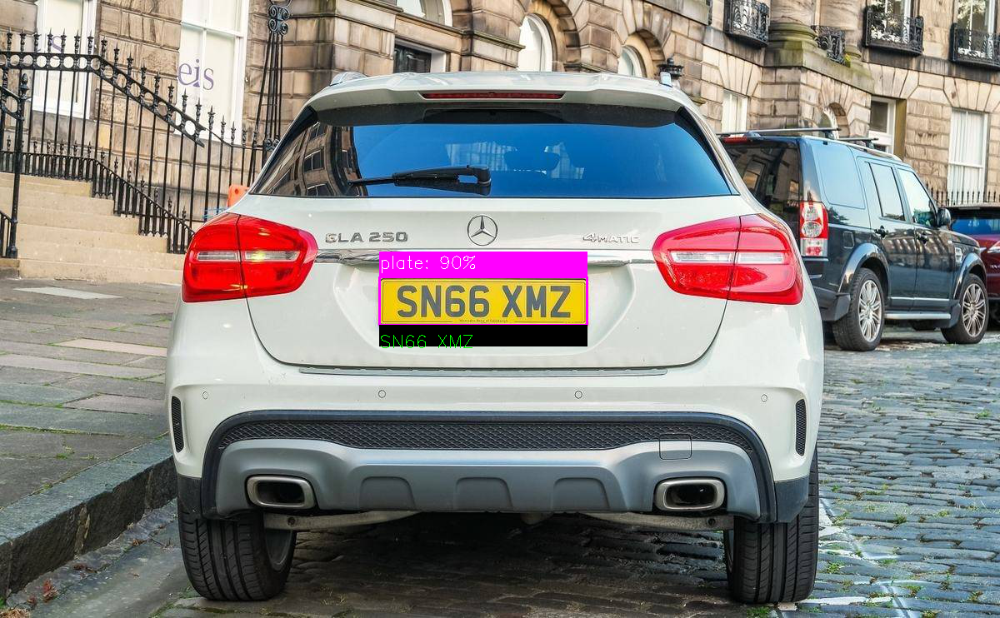

In [ ]:
fig = px.imshow(img)
fig.update_layout(width=700, height=400, margin=dict(l=10, r=10, b=10, t=10))
fig.update_xaxes(showticklabels=False).update_yaxes(showticklabels=False)
fig.show()

In [ ]:
!pip install libgtk1.0-dev

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement libgtk1.0-dev (from versions: none)
ERROR: No matching distribution found for libgtk1.0-dev


[]


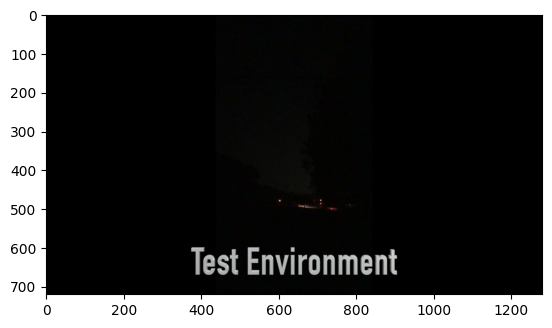

[]


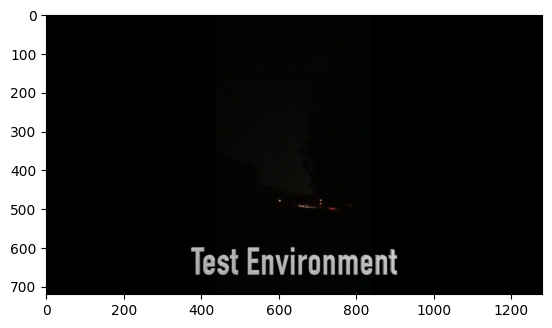

[]


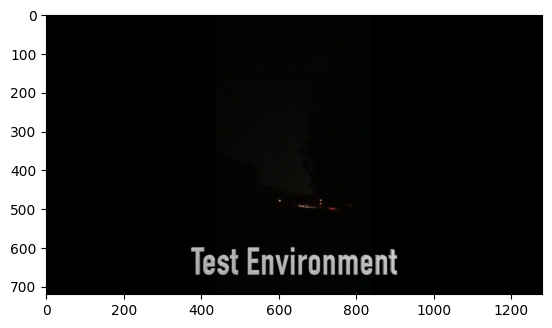

[]


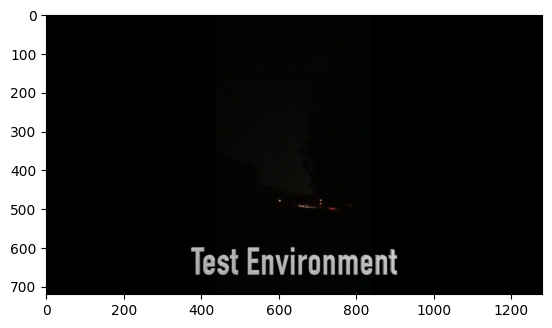

[]


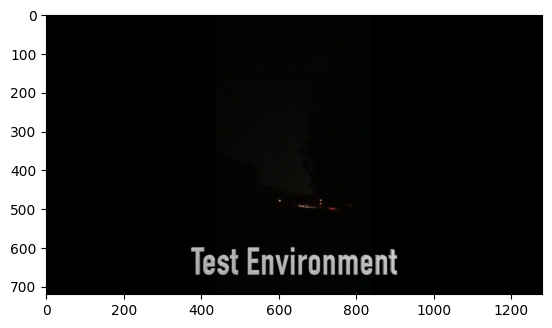

[]


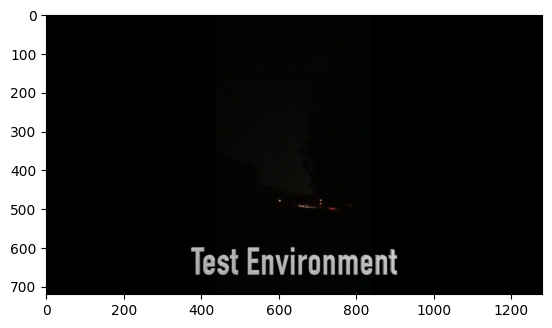

[]


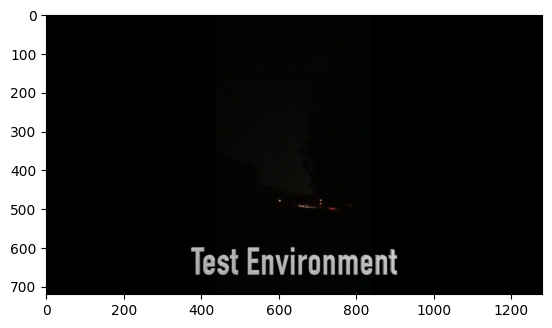

[]


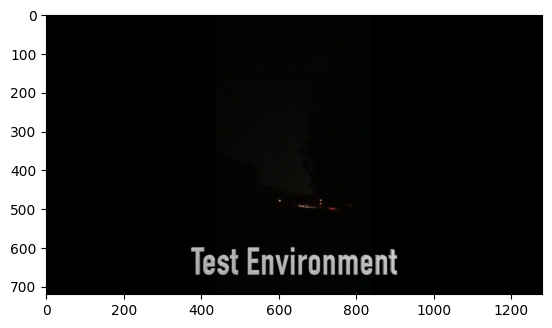

[]


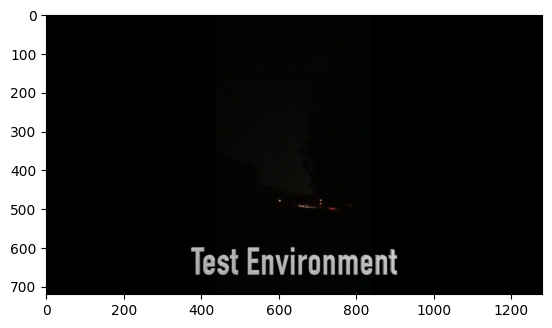

[]


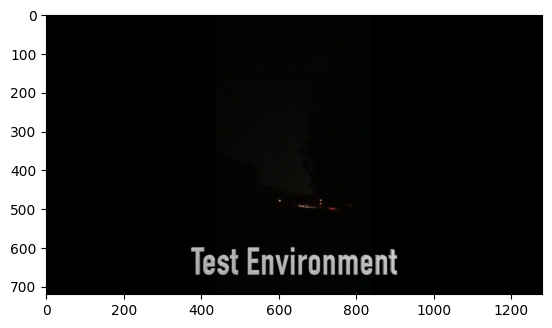

[]


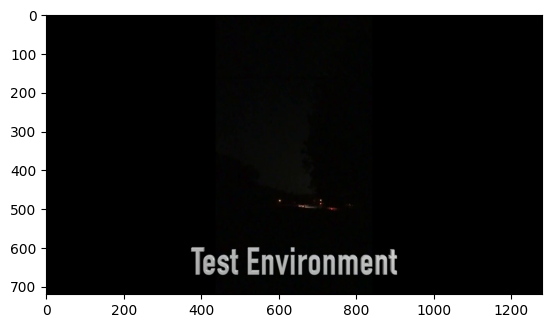

[]


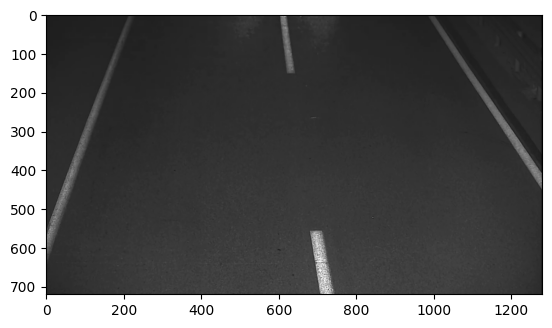

[]


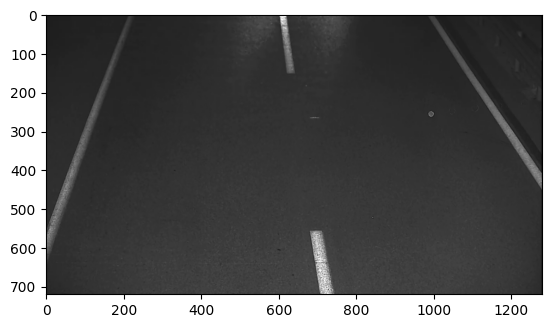

[]


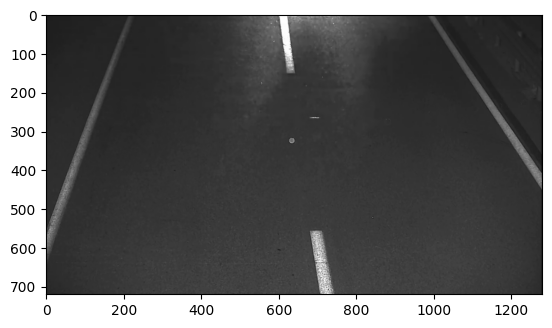

[]


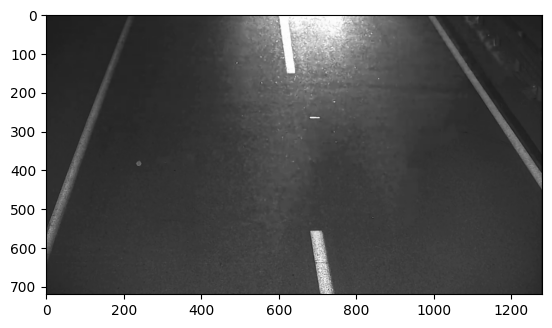

[]


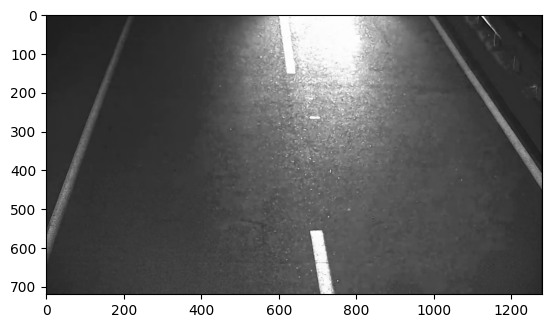

[]


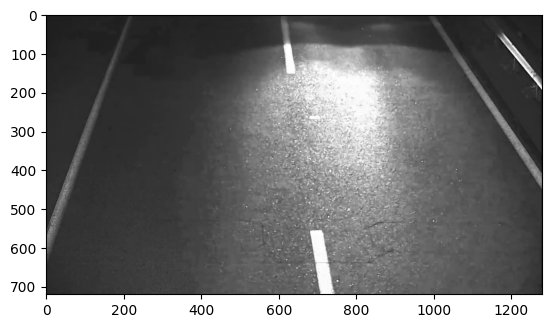

[]


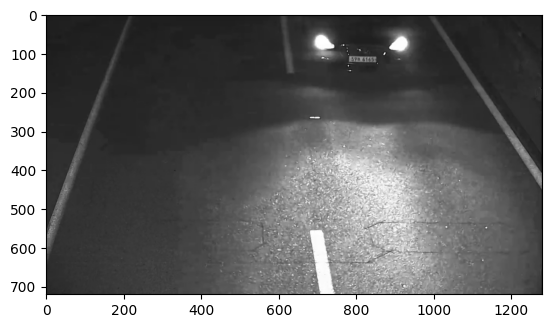

[]


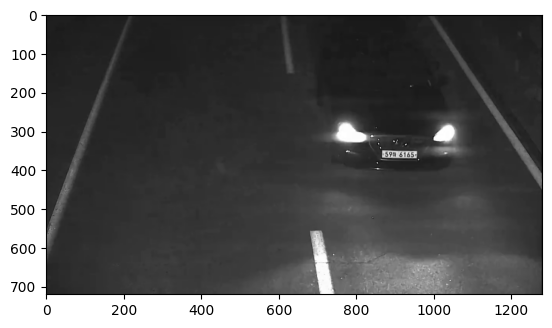

[]


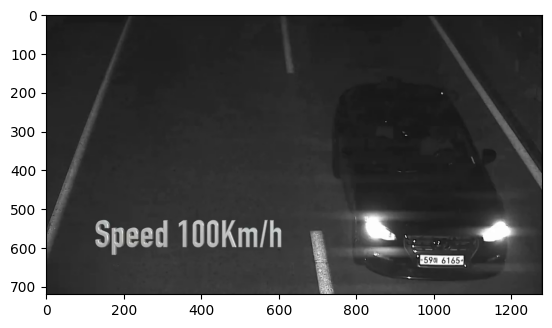

[]


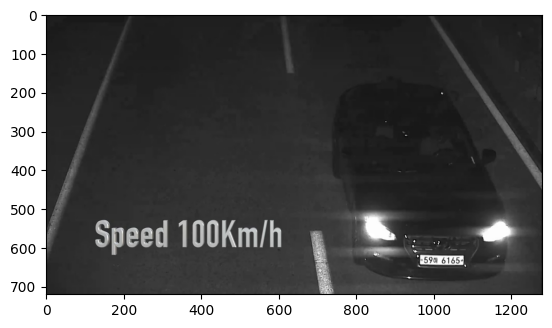

[]


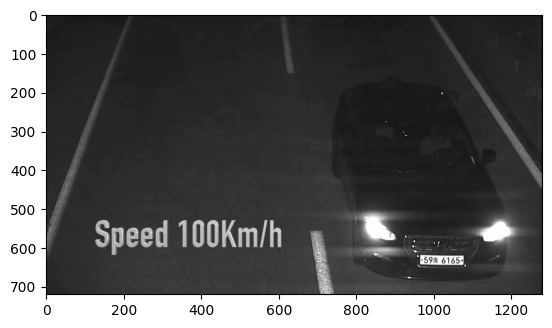

[]


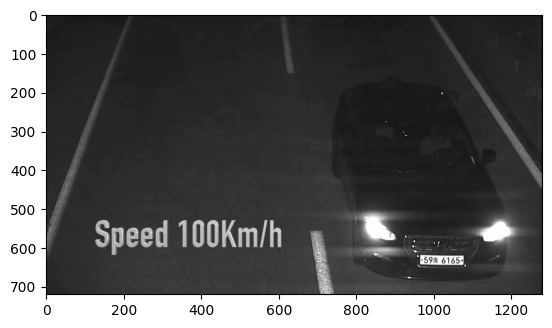

[]


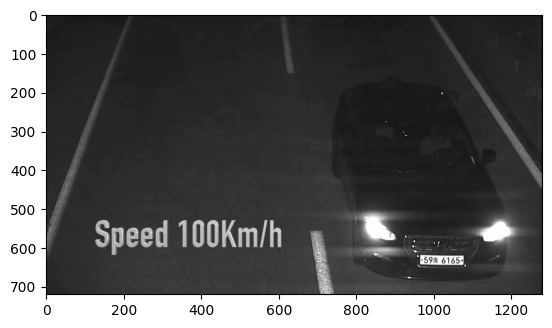

[]


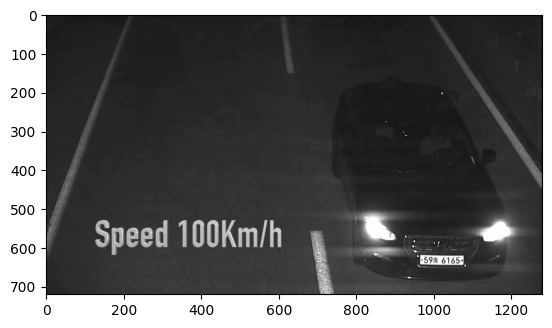

[]


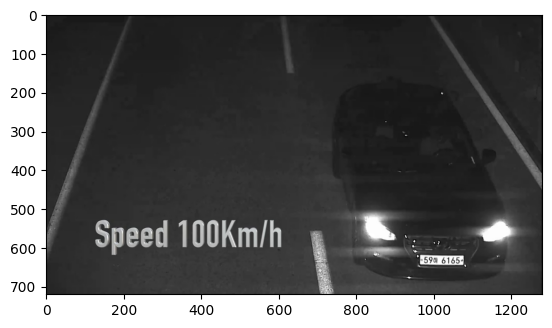

[]


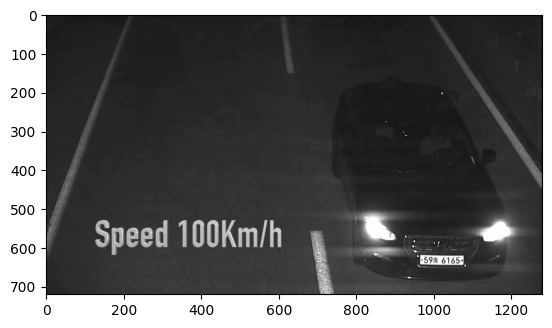

[]


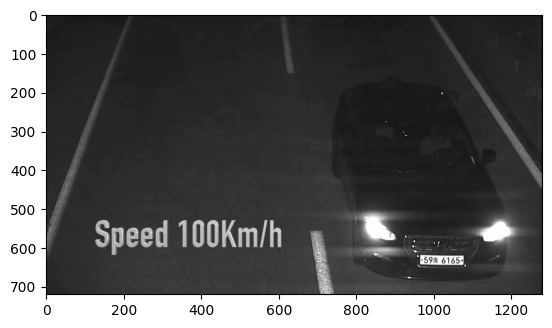

[]


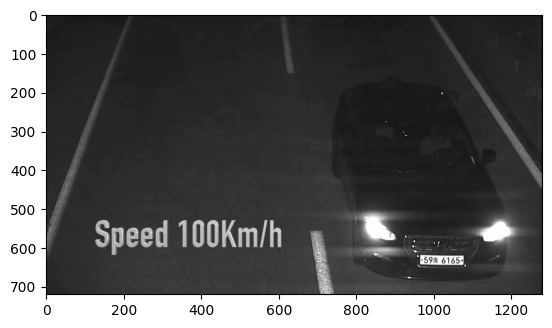

[]


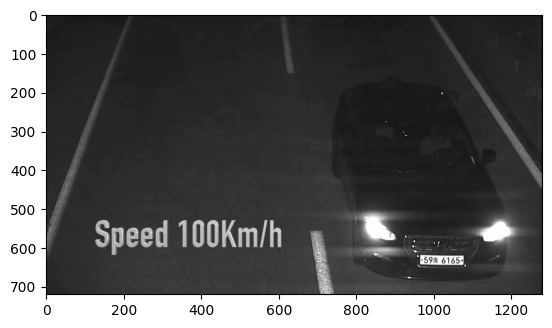

[]


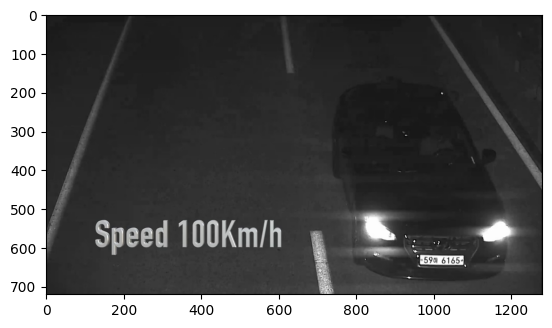

[]


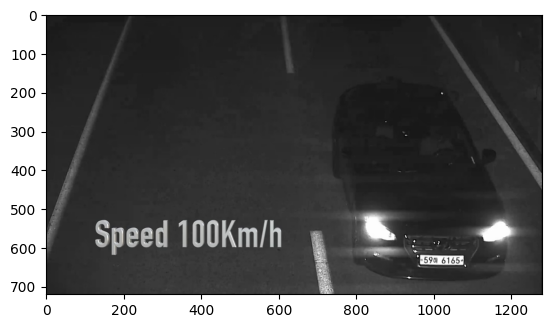

[]


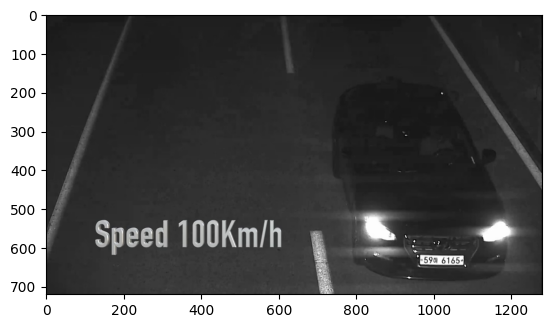

[]


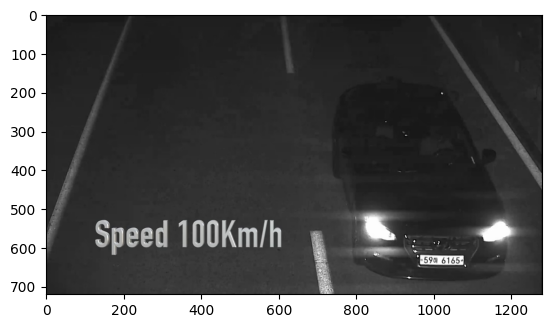

[]


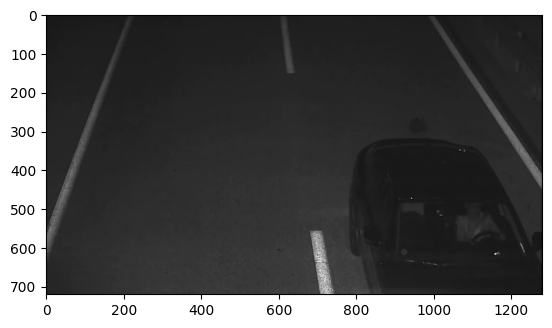

[]


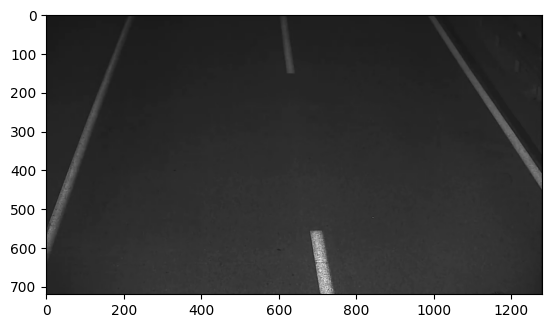

[]


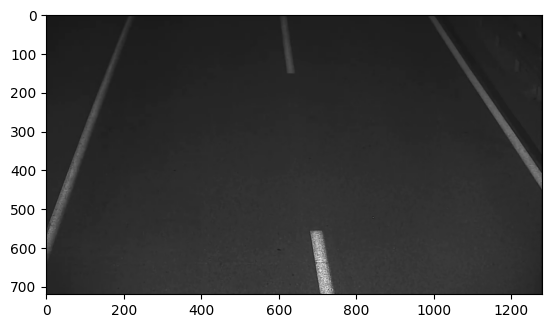

[]


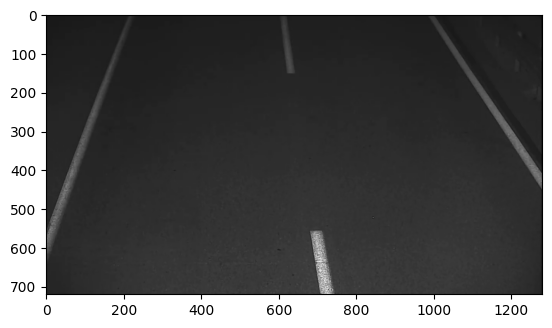

[]


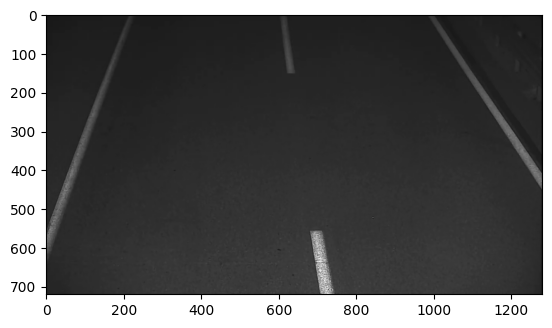

[]


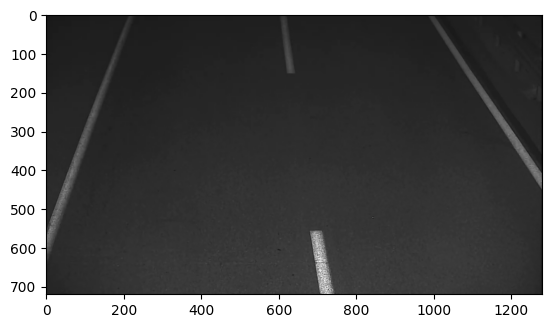

[]


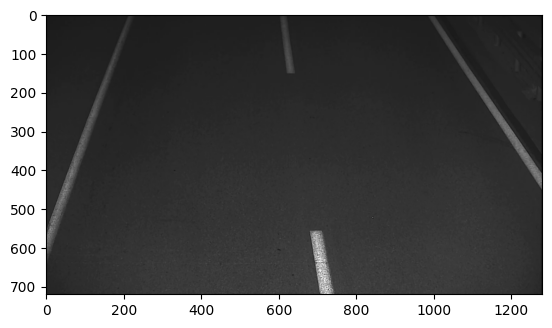

[]


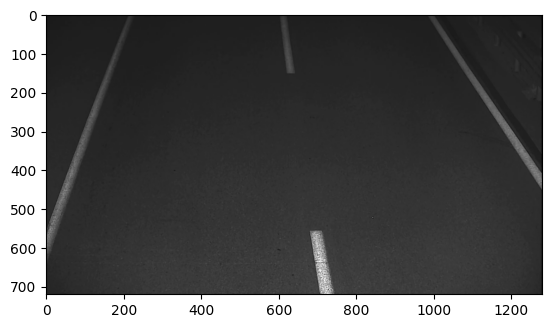

[]


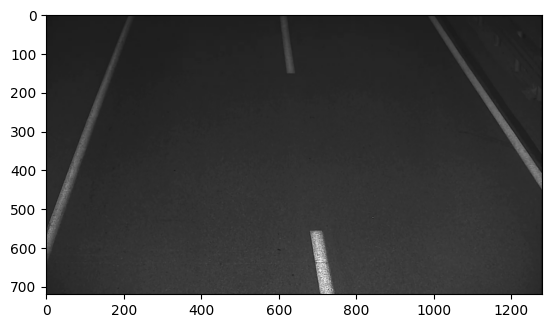

[]


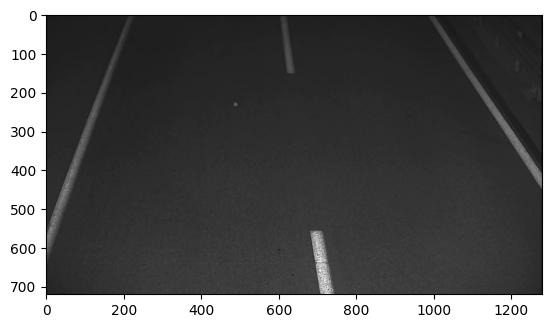

[]


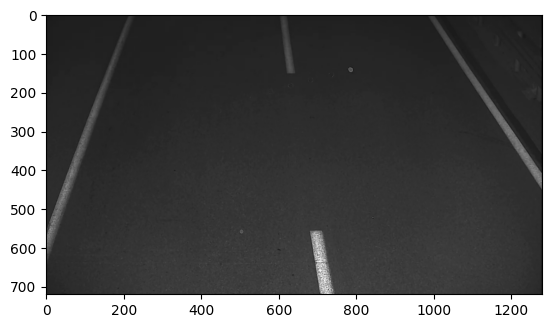

[]


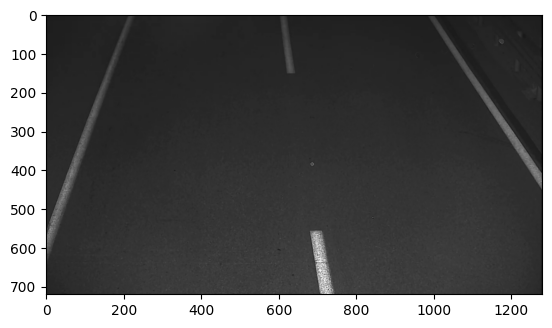

[]


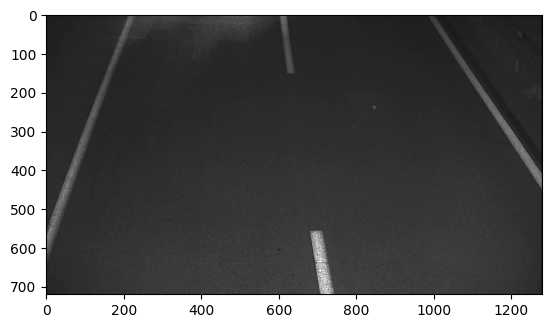

[]


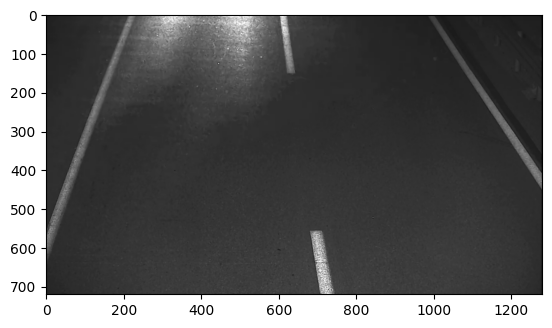

[]


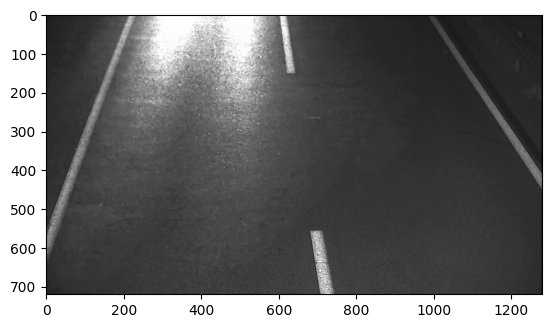

[]


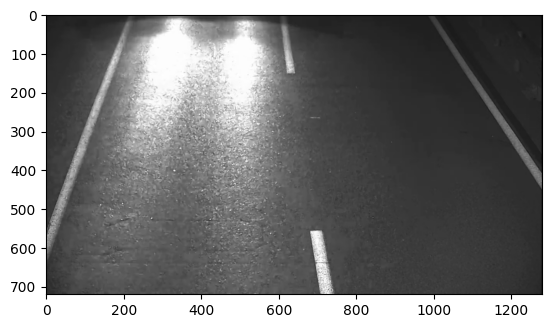

[]


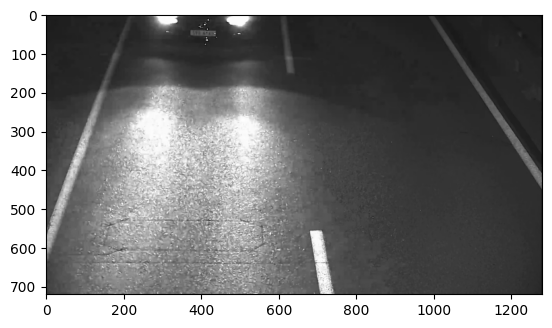

[]


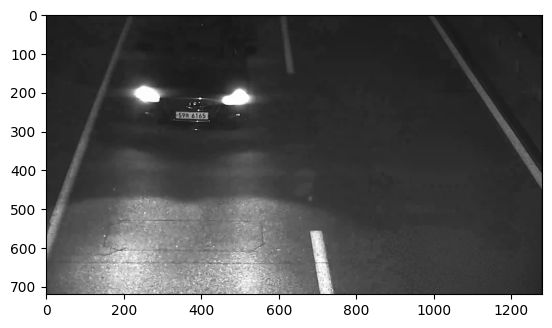

['590 61659']


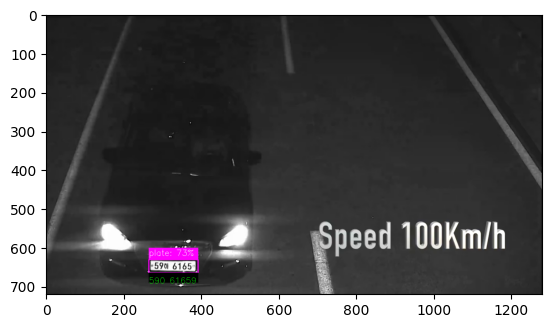

['590 61659']


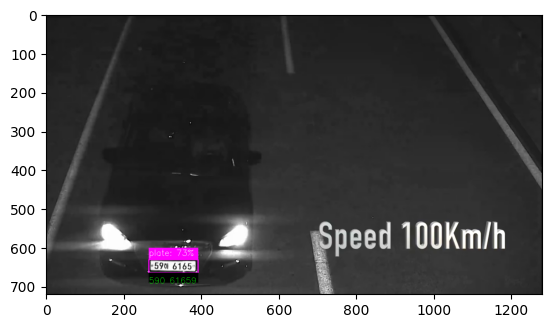

['590 61659']


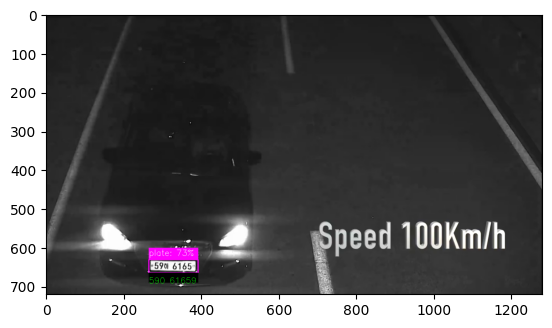

['590 61659']


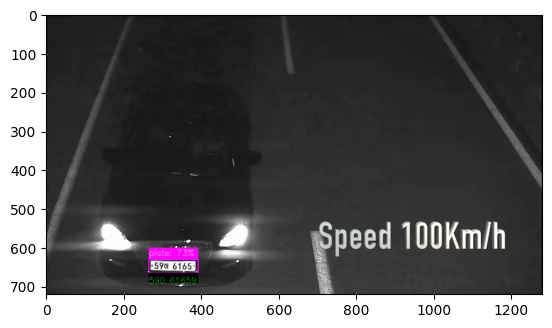

['590 61659']


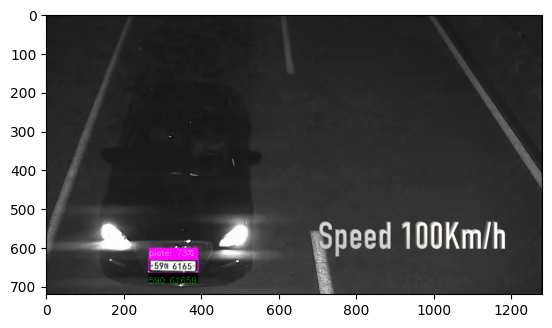

['590 61659']


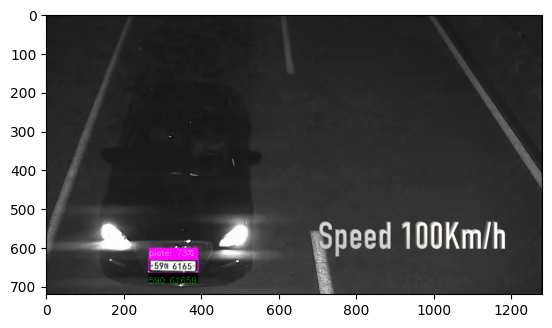

['590 61659']


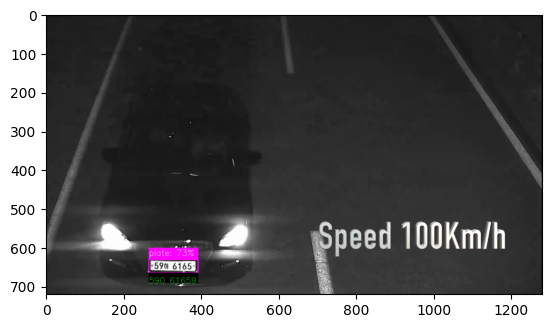

['590 61659']


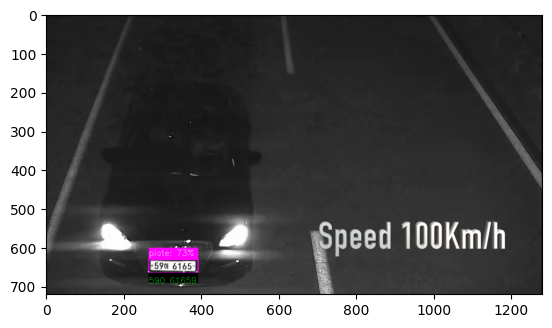

['590 61659']


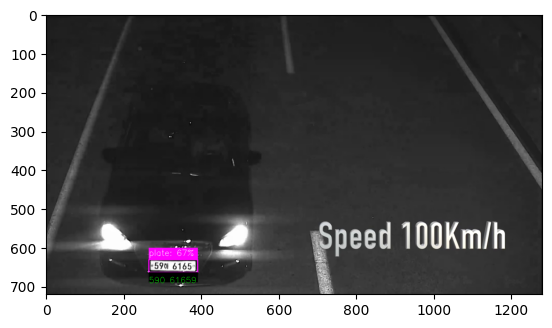

['590 61659']


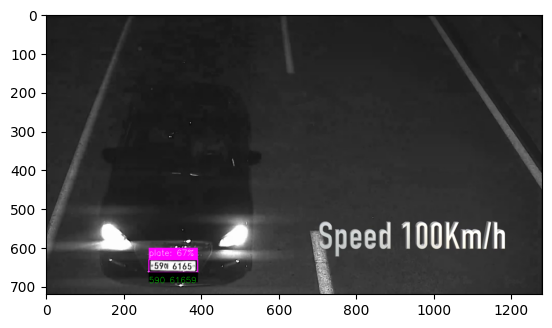

['590 61659']


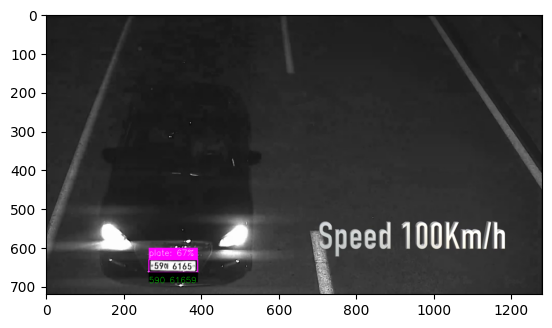

['590 61659']


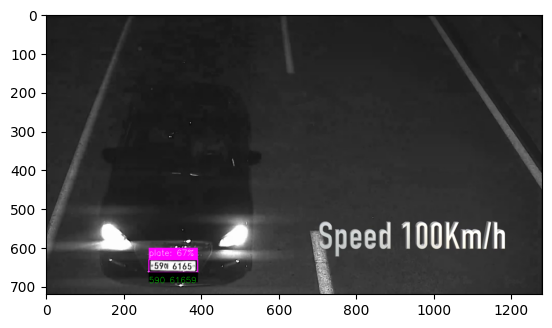

['590 61659']


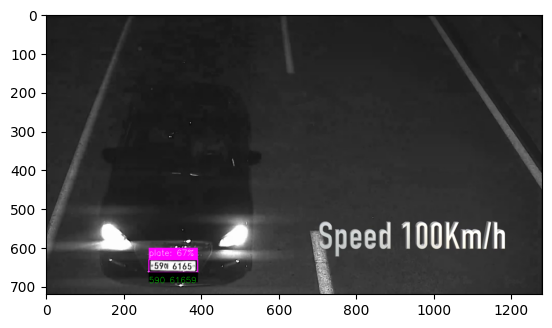

['590 61659']


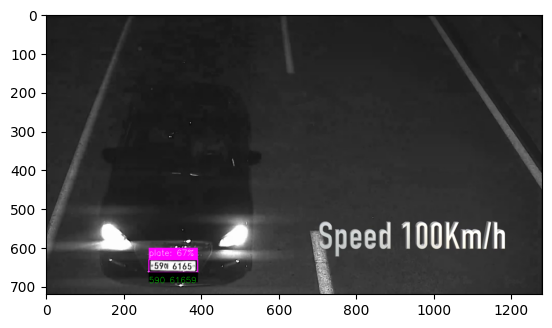

['590 61659']


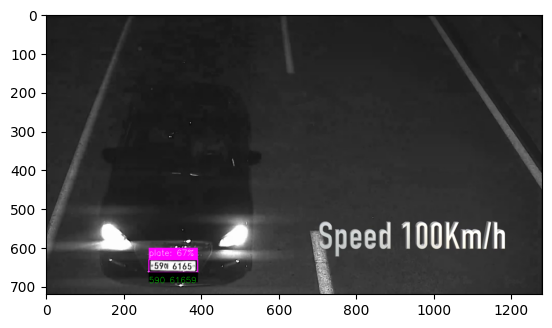

[]


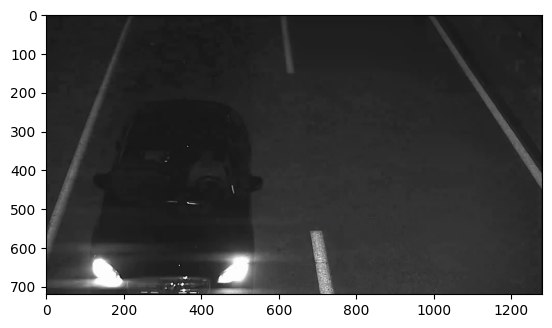

[]


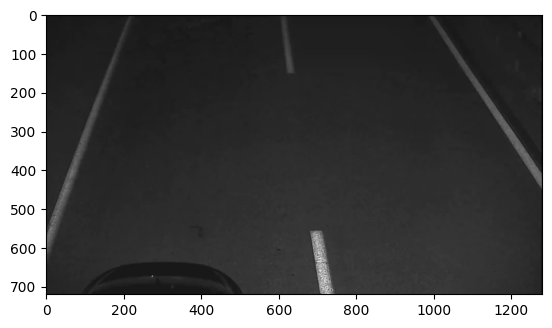

[]


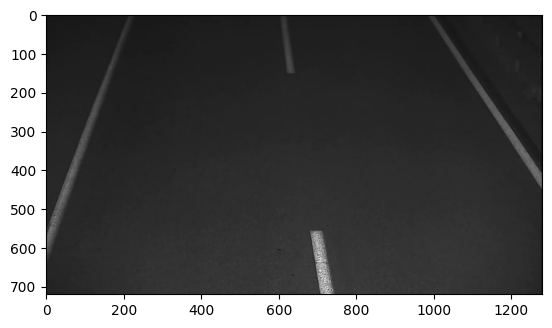

[]


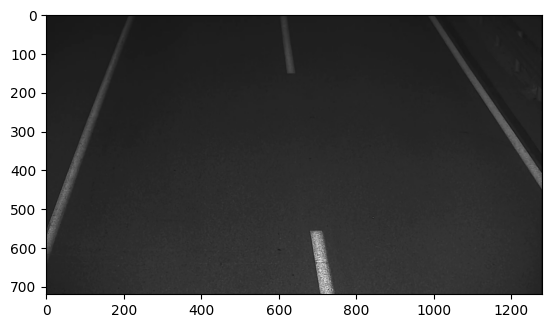

[]


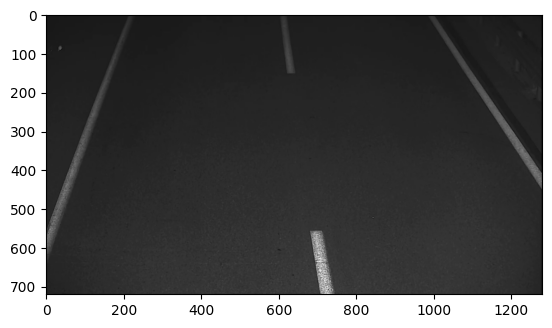

[]


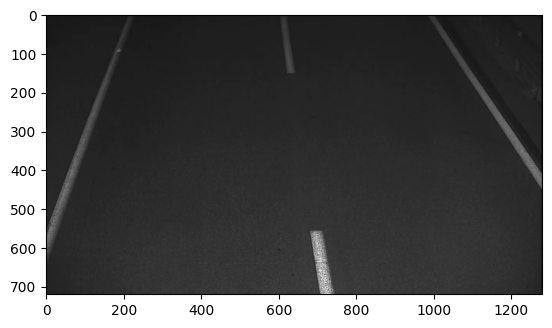

[]


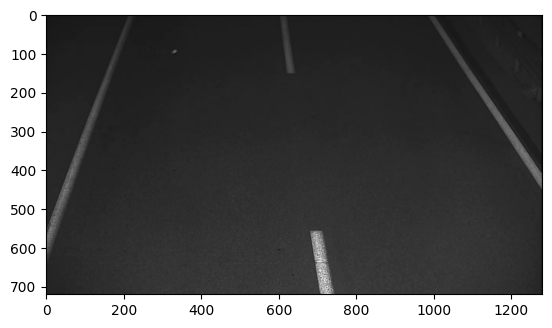

[]


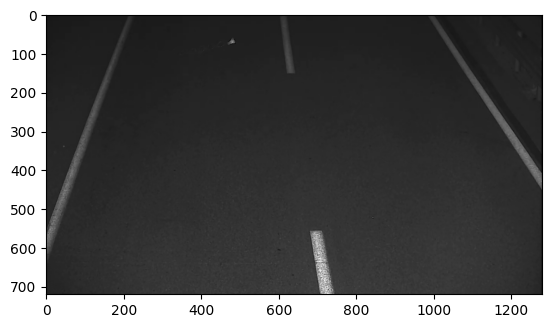

Unable to read video


In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

cap = cv2.VideoCapture('/content/drive/MyDrive/Colab Notebooks/testing/anprTest.mp4')
text_results = []
while cap.isOpened():
    ret, frame = cap.read()

    if ret == False:
        print('Unable to read video')
        break
        
    for i in range(5):
            ret = cap.grab()

    results, texts = yolo_predictions(frame,net)
    text_results.append(texts)
    print(texts)
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    plt.imshow(frame_rgb)
    plt.show()
#     if cv2.waitKey(30) == 27 :
#         break
#     if cv2.waitKey(1) == ord('q'):
#             break

cv2.destroyAllWindows()
cap.release()

In [ ]:
img = Image.open('/content/drive/MyDrive/Colab Notebooks/testing/TEST2.png')

import numpy as np
img = np.array(img)
results, texts = yolo_predictions(img, net)
texts

['LMGO RXB', 'LSSS EZV']

In [44]:
!zip -r /content/yolov5.zip /content/yolov5

  adding: content/yolov5/ (stored 0%)
  adding: content/yolov5/models/ (stored 0%)
  adding: content/yolov5/models/experimental.py (deflated 59%)
  adding: content/yolov5/models/yolov5s.yaml (deflated 60%)
  adding: content/yolov5/models/__pycache__/ (stored 0%)
  adding: content/yolov5/models/__pycache__/yolo.cpython-310.pyc (deflated 49%)
  adding: content/yolov5/models/__pycache__/experimental.cpython-310.pyc (deflated 44%)
  adding: content/yolov5/models/__pycache__/common.cpython-310.pyc (deflated 54%)
  adding: content/yolov5/models/__pycache__/__init__.cpython-310.pyc (deflated 27%)
  adding: content/yolov5/models/yolov5l.yaml (deflated 60%)
  adding: content/yolov5/models/yolov5x.yaml (deflated 60%)
  adding: content/yolov5/models/yolov5n.yaml (deflated 60%)
  adding: content/yolov5/models/hub/ (stored 0%)
  adding: content/yolov5/models/hub/anchors.yaml (deflated 72%)
  adding: content/yolov5/models/hub/yolov5s-LeakyReLU.yaml (deflated 59%)
  adding: content/yolov5/models/hub/

In [48]:
from google.colab import files
files.download('labels.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>